In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


In [2]:
df=pd.read_csv("credit_score_classification.csv",low_memory=False)

In [3]:
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


# Explatory Data Analysis Process

    1-Business and data understanding.
    2-Using df . info () check the datatype of columns.
    3-Check for duplicates in your data and remove it.
    4-Check for duplicates in your data and remove it.
    5-Clean the data by fixing the errors using apply function and try except.
    6-Repeat step 4.
    7-Apply feature engineering if possible.
    8-Check for missing values and handle them first try to remove columns that have a lot of missing values then try imputation techniques or dropping rows.
    9-Repeat step 4.
    10-Detect outliers and split df to outliers and clean then analyze outliers df.
   

### Business and data understanding.

https://github.com/bozekry/final-data-science-project/blob/main/About%20Dataset.pdf

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [5]:
df.duplicated().sum()

0

## Univariate analysis for categorical  feature to chek for error


## Month

In [6]:
df["Month"].value_counts()

January     12500
February    12500
March       12500
April       12500
May         12500
June        12500
July        12500
August      12500
Name: Month, dtype: int64

<AxesSubplot:xlabel='Month', ylabel='count'>

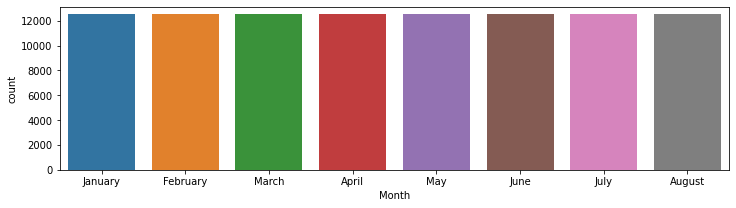

In [7]:
plt.figure(figsize=(12,3))
sns.countplot(data=df,x="Month")

## Age

In [8]:
df["Age"].value_counts()

38      2833
28      2829
31      2806
26      2792
32      2749
        ... 
471        1
1520       1
8663       1
3363       1
1342       1
Name: Age, Length: 1788, dtype: int64

In [9]:
df["Age"].unique()

array(['23', '-500', '28_', ..., '4808_', '2263', '1342'], dtype=object)

In [10]:
df["Age"].nunique()

1788

In [11]:
for i in df["Age"]:
    print(i)

23
23
-500
23
23
23
23
23
28_
28
28
28
28
28
28
28
34
34
34
34
34
34
34
34
54
54
55
55
55
55
55
55
21
21
21
21
21
21
21
21
31
31
31
31
31
31
31
31
33
34
34
34
34
34
34_
34
7580
30
30_
30
30
30
30
30
23
23
23
23
23
24
24
24_
44
44
44
44
44
44
45
45
40
40
40
40
40
40
40
41
32
33_
33
33
33
33
33
33
35
35_
35
35
35
35
36
36
39
39
39
39
39
39
39
39
36
-500
37
37
37
37
37
37
30
30
181
30_
30
31
31
31
20
20
20
20
20
20
20
20
45
46
46
46
46
46
46
46
26
26
26
26
26
26
26
26
31
31
31
31
32
32
32
32
41
41
41
41
41
41
41
41
41
41
41
41
41
42
42
42
19
20
20
20
20
20
20
20
31_
31
31
32
32
32
32
32
34
34
34
34
34
34
34
34
48
48
48
48
48
48
48
48
30
30
30
30
30
30
30
30
32
32
32
995
32
32
32
32
40
40
40
40_
40
40
40
40
37
37
37
37
37_
37
37
38
54_
54
55
5079
55
55
55
55
43
43
43
43
43
43
43
44
21_
21
21
21
22
22
22
22
43
43
44
44
44
44
44
44
36
36
37
37
37
37_
37
37
36
36
36
36
36
36
36
36
6409
-500
16
16
16
16
16
16
19
19
20
20
20
7080
20
20
36
36
37
37
37
37
37
37_
18
18
18
18
19
19
19
19
32
32
33
3

45
40
3417
40
40
40
40
41
41
23
23
23
23
23
23
23
23
25
25
25
25
26
26
26
26
14
14
14
14
14
14
14
14
25
25
25
25
26
26
26
26
34
34
34
34
34
34
34
34
46
46
46
46
47
47
47
47
55
55
55
55
55
55
55
55
19
19
19
19
19
19
20
20
32
32
32
32
32
32
32
32
18
18
18
18
18
18
18
18
35
35
35
35
35
35
35
35
31
31
31
31_
32
32_
32_
32
52
52
52
52
52
52
52
52
37
37
37
37
37_
37
37
38
26
26
27
27
27
27
27
27
20
20
429
20_
20
20
20
20
44
44
44
44
45_
45
45
45
39
39
40
40
40
40
8150
40
38
38
38
38
38
38
38
38
41
7746
42
42_
42
42
42
42
43
43
43
43
43
44
44
44
1958
16
16_
16
16
16_
16
16
19_
19
19
19
19
19
20
20
29
29
29
29
29
29
29
29
37_
37
37
37
37
38
38
38
22
22
22
22
22
22
22
22
36
36
37
37
2309
37
37
37
26
26
26
26
26
26
26
26
19_
19
19
5413
19
19
19
20
18
18
18
18
18
19
19
19
37
37
37
38
38
38
38
38
44
44
44_
44
44
44_
44
44
51
51
52
52
52
52
52
52
43
43
43
43
43_
44
44
44
36
2113
36
36
36
36
36
36
15
15
15
15
16
16
16
16
15
15_
15
15
15
15
15
15
34
34
34
34
34
35
35
35
45
45
45
45
46
46
46
46
25
25


In [12]:
def applyinAge(col):
    if "-" in col:
        return col.split("-")[1]
    elif "_" in col:
        return col.split("_")[0]
    else:
        return col
        

In [13]:
df["Age"]=df["Age"].apply(applyinAge)

In [14]:
df["Age"]

0         23
1         23
2        500
3         23
4         23
        ... 
99995     25
99996     25
99997     25
99998     25
99999     25
Name: Age, Length: 100000, dtype: object

In [15]:
df["Age"].value_counts()

38      2994
28      2968
31      2955
26      2945
32      2884
        ... 
1908       1
4583       1
7549       1
3119       1
1342       1
Name: Age, Length: 1728, dtype: int64

In [16]:
df["Age"]=df["Age"].astype('int')

In [17]:
df["Age"].dtype

dtype('int32')

## Occupation

In [18]:
df["Occupation"].value_counts()

_______          7062
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: Occupation, dtype: int64

In [19]:
df["Occupation"].unique()

array(['Scientist', '_______', 'Teacher', 'Engineer', 'Entrepreneur',
       'Developer', 'Lawyer', 'Media_Manager', 'Doctor', 'Journalist',
       'Manager', 'Accountant', 'Musician', 'Mechanic', 'Writer',
       'Architect'], dtype=object)

In [20]:
df[df["Occupation"]=='_______']

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
8,0x160e,CUS_0x21b1,January,Rick Rothackerj,28,004-07-5839,_______,34847.84,3037.986667,2,...,Good,605.03,24.464031,26 Years and 7 Months,No,18.816215,104.291825168246,Low_spent_Small_value_payments,470.69062692529184,Standard
16,0x161a,CUS_0x2dbc,January,Langep,34,486-85-3974,_______,143162.64,12187.220000,1,...,Good,1303.01,28.616735,17 Years and 9 Months,No,246.992319,168.413702679309,!@9#%8,1043.3159778669492,Good
18,0x161c,CUS_0x2dbc,March,Langep,34,486-85-3974,_______,143162.64,NaN,1,...,Good,1303.01,26.519815,17 Years and 11 Months,No,246.992319,__10000__,High_spent_Small_value_payments,715.741367403555,Good
20,0x161e,CUS_0x2dbc,May,Langep,34,486-85-3974,_______,143162.64,12187.220000,1,...,Good,1303.01,31.376150,18 Years and 1 Months,No,246.992319,430.9475278803298,Low_spent_Large_value_payments,810.7821526659284,Good
29,0x162b,CUS_0xb891,June,Jasond,55,#F%$D@*&8,_______,30689.89,2612.490833,2,...,_,632.46,27.445422,17 Years and 8 Months,No,16.415452,84.95284817115969,High_spent_Small_value_payments,419.8807835023488,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99920,0x25f7a,CUS_0x2654,January,enj,37,647-67-8889,_______,139664.96,11777.746667,3,...,_,365.66,31.043048,29 Years and 7 Months,Yes,423.731016,282.78234595777644,High_spent_Large_value_payments,711.2613048966028,Standard
99935,0x25f8d,CUS_0xb11c,August,Yinka Adegokej,38,546-94-4789,_______,15319.65,1460.637500,6,...,Bad,1453.61,34.557510,11 Years and 4 Months,Yes,28.182033,191.87777851803025,Low_spent_Small_value_payments,216.00393809551707,Poor
99937,0x25f93,CUS_0xad4f,February,Sabina Zawadzkig,500,226-45-0652,_______,22620.79,1722.065833,7,...,Standard,642.46,31.841872,NaN,No,0.000000,105.07629339039072,Low_spent_Large_value_payments,337.1302899429426,Standard
99943,0x25f99,CUS_0xad4f,August,Sabina Zawadzkig,48,226-45-0652,_______,22620.79,NaN,6,...,_,642.46,34.026427,29 Years and 10 Months,No,0.000000,205.21728040016708,Low_spent_Small_value_payments,256.98930293316624,Poor


In [21]:
df.drop(df[df["Occupation"]=='_______'].index,inplace=True)

Text(0, 0.5, 'cout')

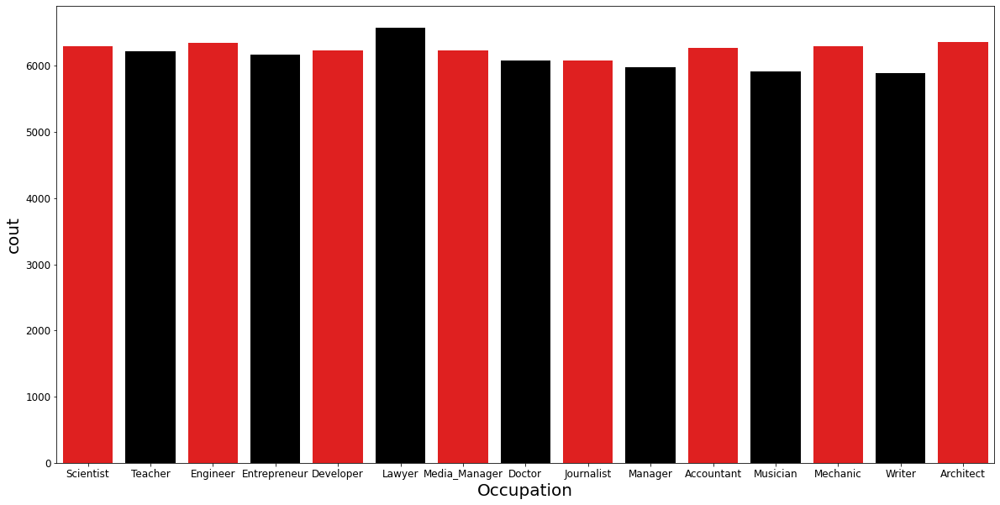

In [22]:
plt.figure(figsize=(20,10))

gfg=sns.countplot(data=df,x="Occupation",palette=["red","black"])

gfg.tick_params(labelsize=12)

gfg.set_xlabel("Occupation",fontsize=20)

gfg.set_ylabel("cout",fontsize=20)

## Annual_Income

In [23]:
df["Annual_Income"].unique()

array(['19114.12', '34847.84', '34847.84_', ..., '20002.88', '39628.99',
       '39628.99_'], dtype=object)

In [24]:
def applyinAnnual_incom(col):
    if "_" in col:
        return col.split("_")[0]
    else:
        return col

In [25]:
df["Annual_Income"]=df["Annual_Income"].apply(applyinAnnual_incom)

In [26]:
df["Annual_Income"]

0        19114.12
1        19114.12
2        19114.12
3        19114.12
4        19114.12
           ...   
99995    39628.99
99996    39628.99
99997    39628.99
99998    39628.99
99999    39628.99
Name: Annual_Income, Length: 92938, dtype: object

In [27]:
df["Annual_Income"]=df["Annual_Income"].astype("float")

In [28]:
df["Annual_Income"].dtype

dtype('float64')

## Num_of_Loan

In [29]:
df["Num_of_Loan"].unique()

array(['4', '1', '3', '967', '-100', '0', '0_', '2', '3_', '2_', '7', '5',
       '5_', '6', '8', '8_', '9', '9_', '4_', '7_', '1_', '1464', '6_',
       '622', '352', '1017', '146', '563', '341', '444', '720', '49',
       '737', '1106', '466', '728', '313', '843', '597_', '617', '119',
       '663', '640', '92_', '1019', '501', '1302', '39', '716', '848',
       '931', '1214', '186', '424', '1001', '1110', '1152', '457', '1433',
       '1187', '52', '1480', '1047', '1035', '1347_', '193', '699', '329',
       '1451', '484', '132', '649', '995', '545', '684', '1135', '1094',
       '654', '58', '348', '614', '1363', '323', '1406', '1348', '430',
       '153', '1461', '905', '1312', '1424', '95', '1353', '1228', '819',
       '1006', '795', '359', '1209', '590', '696', '1185_', '1465', '911',
       '1181', '70', '816', '1369', '143', '1416', '455', '55', '1096',
       '1474', '420', '1131', '904', '89', '1259', '527', '1241', '449',
       '418', '23', '238', '638', '138', '235_', '2

In [30]:
df["Num_of_Loan"]=df["Num_of_Loan"].apply(applyinAnnual_incom)

In [31]:
df["Num_of_Loan"]=df["Num_of_Loan"].astype("int")

## Type_of_Loan

In [32]:
df["Type_of_Loan"]

0        Auto Loan, Credit-Builder Loan, Personal Loan,...
1        Auto Loan, Credit-Builder Loan, Personal Loan,...
2        Auto Loan, Credit-Builder Loan, Personal Loan,...
3        Auto Loan, Credit-Builder Loan, Personal Loan,...
4        Auto Loan, Credit-Builder Loan, Personal Loan,...
                               ...                        
99995                          Auto Loan, and Student Loan
99996                          Auto Loan, and Student Loan
99997                          Auto Loan, and Student Loan
99998                          Auto Loan, and Student Loan
99999                          Auto Loan, and Student Loan
Name: Type_of_Loan, Length: 92938, dtype: object

## Num_of_Delayed_Payment

In [33]:
df["Num_of_Delayed_Payment"]

0          7
1        NaN
2          7
3          4
4        NaN
        ... 
99995      7
99996      7
99997      6
99998    NaN
99999      6
Name: Num_of_Delayed_Payment, Length: 92938, dtype: object

In [34]:
def applyingNum_of_Delayed_Payment(col):
    #if "-" in col:
        #return col.split("-")[1]
    if "_" in str(col):
        return str(col).split("_")[0]
    else:
        return str(col)

In [35]:
applyingNum_of_Delayed_Payment('-2_')

'-2'

In [36]:
df["Num_of_Delayed_Payment"].unique()

array(['7', nan, '4', '8_', '6', '1', '-1', '3_', '0', '5', '3', '9',
       '12', '15', '17', '10', '2', '2_', '11', '14', '8', '20', '22',
       '13', '13_', '14_', '16', '12_', '18', '19', '23', '21', '24',
       '3318', '3083', '22_', '1338', '4_', '3104', '21_', '25', '10_',
       '183_', '9_', '1106', '834', '19_', '26', '24_', '17_', '23_',
       '2672', '20_', '2008', '-3', '538', '1_', '16_', '-2', '3478',
       '2420', '15_', '707', '708', '26_', '18_', '3815', '11_', '28',
       '27', '5_', '1867', '2250', '1463', '25_', '7_', '4126', '2882',
       '1941', '2628', '132', '3069', '306', '0_', '6_', '3539', '3684',
       '1823', '4128', '1946', '827', '2297', '2566', '904', '182', '929',
       '3568', '2503', '1552', '2812', '1697', '851', '3905', '923', '88',
       '1668', '3253', '808', '2689', '3858', '642', '3457', '1402',
       '1732', '3154', '847', '3037', '2204', '3103', '1063', '2056',
       '1282', '2569_', '211', '793', '3484', '411', '3491', '2072',
   

In [37]:
df["Num_of_Delayed_Payment"]=df["Num_of_Delayed_Payment"].apply(applyingNum_of_Delayed_Payment)

In [38]:
df["Num_of_Delayed_Payment"].unique()

array(['7', 'nan', '4', '8', '6', '1', '-1', '3', '0', '5', '9', '12',
       '15', '17', '10', '2', '11', '14', '20', '22', '13', '16', '18',
       '19', '23', '21', '24', '3318', '3083', '1338', '3104', '25',
       '183', '1106', '834', '26', '2672', '2008', '-3', '538', '-2',
       '3478', '2420', '707', '708', '3815', '28', '27', '1867', '2250',
       '1463', '4126', '2882', '1941', '2628', '132', '3069', '306',
       '3539', '3684', '1823', '4128', '1946', '827', '2297', '2566',
       '904', '182', '929', '3568', '2503', '1552', '2812', '1697', '851',
       '3905', '923', '88', '1668', '3253', '808', '2689', '3858', '642',
       '3457', '1402', '1732', '3154', '847', '3037', '2204', '3103',
       '1063', '2056', '1282', '2569', '211', '793', '3484', '411',
       '3491', '2072', '3050', '1049', '2162', '3402', '1718', '1014',
       '3260', '3855', '84', '2311', '3251', '1832', '4069', '3010',
       '733', '4241', '166', '2461', '1749', '3200', '663', '2185',
       '416

In [39]:
df["Num_of_Delayed_Payment"]=df["Num_of_Delayed_Payment"].astype("float")

## Changed_Credit_Limit

In [40]:
df["Changed_Credit_Limit"]

0        11.27
1        11.27
2            _
3         6.27
4        11.27
         ...  
99995     11.5
99996     11.5
99997     11.5
99998     11.5
99999     11.5
Name: Changed_Credit_Limit, Length: 92938, dtype: object

In [41]:
for i in df["Changed_Credit_Limit"]:
    print(i)

11.27
11.27
_
6.27
11.27
9.27
11.27
11.27
7.42
5.42
5.42
6.42
5.42
5.42
5.42
7.1
9.1
7.1
7.1
7.1
1.99
1.99
1.99
-2.01
-1.01
1.99
1.99
2.58
2.58
2.58
2.58
2.58
2.58
2.58
2.58
10.14
10.14
10.14
10.14
10.14
9.14
10.14
9.34
15.34
9.34
8.34
9.34
11.34
9.34
9.34
17.13
17.13
17.13
18.13
17.13
17.13
8.24
_
_
8.24
11.24
8.24
8.24
8.24
5.76
-1.2400000000000002
1.7599999999999998
5.76
5.76
5.76
5.76
5.76
11.0
11.0
11.0
8.0
11.0
11.0
11.0
3.51
3.51
3.51
3.51
3.51
3.51
3.51
3.51
5.54
4.54
5.54
0.54
11.54
5.54
5.54
5.54
8.86
8.86
8.86
8.86
8.86
_
_
8.86
7.83
7.83
7.83
7.83
7.83
7.83
10.83
7.83
6.28
6.28
10.28
6.28
6.28
6.28
6.28
6.28
9.13
9.13
9.13
9.13
9.13
13.13
9.13
9.13
9.22
9.22
9.22
9.22
8.22
8.22
9.22
2.2200000000000006
17.92
11.920000000000002
17.92
15.920000000000002
17.92
17.92
13.920000000000002
17.92
9.95
9.95
15.95
9.95
9.95
8.95
9.95
4.17
4.17
4.17
4.17
4.17
4.17
4.17
8.969999999999997
7.97
7.97
7.97
7.97
7.97
7.97
0.86
_
0.86
-4.14
0.86
-0.14
0.86
0.86
15.79
15.79
15.79
15.79
15.79
21

19.23
19.23
23.23
7.71
7.71
7.71
7.71
7.71
7.71
7.71
7.71
3.32
9.32
3.32
1.3199999999999998
3.32
3.32
3.32
3.32
17.53
17.53
17.53
17.53
17.53
17.53
11.76
6.76
11.76
7.76
11.76
11.76
11.76
11.75
11.75
11.75
15.75
11.75
11.75
10.75
17.28
12.28
12.28
12.28
12.28
12.28
10.28
12.28
11.88
11.88
11.88
11.88
11.88
11.88
11.88
11.88
16.91
16.91
16.91
16.91
16.91
19.91
16.91
16.55
14.55
14.55
14.55
14.55
14.55
14.55
24.66
24.66
28.66
24.66
24.66
24.66
24.66
24.66
8.68
8.68
8.68
5.68
8.68
8.68
8.68
19.61
13.61
19.61
19.61
19.61
26.61
19.61
13.61
5.8900000000000015
0.8900000000000001
3.89
3.89
3.89
3.89
3.89
3.89
6.35
8.35
6.35
6.35
6.35
6.35
6.35
11.84
11.84
11.84
11.84
11.84
11.84
11.84
11.84
1.17
1.17
4.17
1.17
1.17
4.17
1.17
1.17
-0.71
4.29
4.29
4.29
4.29
0.29000000000000004
5.29
-1.71
3.52
_
0.52
2.52
3.52
3.52
-3.48
3.52
9.89
3.890000000000001
8.89
6.8900000000000015
9.89
9.89
16.89
9.89
4.87
4.87
7.87
10.87
4.87
4.87
4.87
4.87
5.01
11.01
11.01
11.01
9.01
11.01
11.01
_
3.57
3.57
-3.43
3.57
3

5.38
5.38
5.38
5.38
5.38
18.31
23.31
18.31
18.31
18.31
18.31
18.31
9.5
11.5
9.5
11.5
11.5
11.5
11.5
11.5


In [42]:
df[df["Changed_Credit_Limit"]=="_"]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
2,0x1604,CUS_0xd40,March,Aaron Maashoh,500,821-00-0265,Scientist,19114.120,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
65,0x1663,CUS_0x4157,February,Charlie Zhur,23,070-19-1622,Doctor,114838.410,9843.867500,2,...,Good,1377.74,27.626325,21 Years and 5 Months,NM,226.892792,212.23560220847847,High_spent_Large_value_payments,785.2583558699787,Good
66,0x1664,CUS_0x4157,March,Charlie Zhur,23,070-19-1622,Doctor,114838.410,NaN,2,...,Good,1377.74,35.141567,21 Years and 6 Months,NM,226.892792,470.3857956796373,High_spent_Small_value_payments,547.1081623988198,Good
109,0x16a3,CUS_0x6c66,June,NaN,39,328-33-6328,Manager,8701.545,519.128750,6,...,Standard,2602.69,28.570031,9 Years and 4 Months,Yes,36.548197,52.931613407134115,Low_spent_Medium_value_payments,242.43306442147872,Poor
110,0x16a4,CUS_0x6c66,July,NaN,39,328-33-6328,Manager,8701.545,NaN,6,...,Standard,2602.69,38.465415,NaN,Yes,36.548197,30.471806299271933,Low_spent_Medium_value_payments,264.8928715293409,Poor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99509,0x25d0f,CUS_0x504e,June,Emilyf,17,569-84-9250,Accountant,72572.460,6233.705000,4,...,Standard,1321.46_,39.578007,20 Years and 3 Months,Yes,176.374432,76.46379642912784,!@9#%8,610.5322719336395,Standard
99548,0x25d4a,CUS_0x2637,May,NaN,28,272-33-1370,Writer,29090.500,2472.208333,5,...,_,1612.7,26.151395,16 Years and 2 Months,Yes,67.439731,35.401299066480114,High_spent_Medium_value_payments,394.3798029820068,Poor
99618,0x25db4,CUS_0xae66,March,Jino,7490,721-45-4479,Writer,142560.360,11773.030000,6,...,Standard,220.75,35.576245,17 Years and 5 Months,No,76.772094,194.7874766731884,High_spent_Large_value_payments,1145.7434294028362,Standard
99800,0x25ec6,CUS_0x1232,January,NaN,16,441-26-1297,Developer,14937.490,NaN,8,...,Bad,3699.44,23.574545,13 Years and 2 Months,Yes,50.960878,97.58693258712627,Low_spent_Small_value_payments,255.73127246656225,Standard


In [43]:
df.drop(df[df["Changed_Credit_Limit"]=="_"].index,inplace=True)

In [44]:
df["Changed_Credit_Limit"]=df["Changed_Credit_Limit"].apply(lambda x:x.split("-")[-1])

In [45]:
df["Changed_Credit_Limit"]=df["Changed_Credit_Limit"].astype("float")

## Credit_Mix

In [46]:
df[df["Credit_Mix"]=='_']

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
10,0x1610,CUS_0x21b1,March,Rick Rothackerj,28,004-07-5839,Teacher,34847.84,3037.986667,2,...,_,605.03,33.224951,26 Years and 9 Months,No,18.816215,58.51597569589465,High_spent_Large_value_payments,466.46647639764313,Standard
19,0x161d,CUS_0x2dbc,April,Langep,34,486-85-3974,Engineer,143162.64,12187.220000,1,...,_,1303.01,39.501648,NaN,No,246.992319,825.2162699393922,Low_spent_Medium_value_payments,426.5134106068658,Good
35,0x1635,CUS_0x1cdb,April,Deepaa,21,615-06-7821,Developer,35547.71,2853.309167,7,...,_,943.86,28.924954,30 Years and 11 Months,Yes,0.000000,96.78548508587444,High_spent_Medium_value_payments,438.5454315807922,Standard
36,0x1636,CUS_0x1cdb,May,Deepaa,21,615-06-7821,Developer,35547.71,2853.309167,7,...,_,943.86,41.776187,31 Years and 0 Months,Yes,0.000000,62.72327834435009,High_spent_Small_value_payments,482.6076383223166,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99988,0x25fde,CUS_0x8600,May,Sarah McBridec,28,#F%$D@*&8,Architect,20002.88,1929.906667,10,...,_,3571.7,28.508250,6 Years and 0 Months,Yes,60.964772,213.97800979403817,Low_spent_Small_value_payments,208.04788449920608,Standard
99992,0x25fe6,CUS_0x942c,January,Nicks,24,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,32.991333,31 Years and 3 Months,No,35.104023,401.1964806036356,Low_spent_Small_value_payments,189.64108011929028,Poor
99994,0x25fe8,CUS_0x942c,March,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,39.323569,31 Years and 5 Months,No,35.104023,140.58140274528395,High_spent_Medium_value_payments,410.2561579776419,Poor
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.86622816574095,Poor


<AxesSubplot:xlabel='Credit_Mix', ylabel='count'>

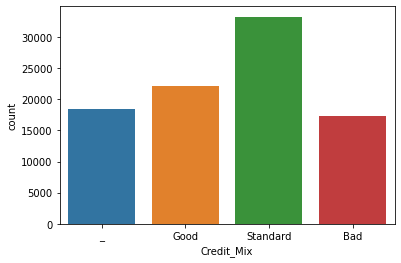

In [47]:
sns.countplot(data=df,x="Credit_Mix")

In [48]:
df["Credit_Mix"]=df["Credit_Mix"].apply(lambda x:x.replace('_',"Standard"))

In [49]:
df["Credit_Mix"].unique()

array(['Standard', 'Good', 'Bad'], dtype=object)

<AxesSubplot:xlabel='Credit_Mix', ylabel='count'>

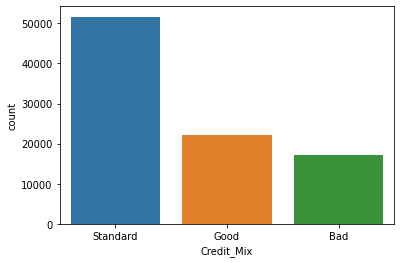

In [50]:
sns.countplot(data=df,x="Credit_Mix")

## Outstanding_Debt

In [51]:
for i in df["Outstanding_Debt"]:
    print(i)

809.98
809.98
809.98
809.98
809.98
809.98
809.98
605.03
605.03
605.03
605.03
605.03
605.03
605.03
1303.01
1303.01
1303.01
1303.01
1303.01
632.46
632.46
632.46
632.46
632.46
632.46
632.46
943.86
943.86
943.86
943.86
943.86
943.86
943.86
943.86
548.2
548.2
548.2
548.2
548.2
548.2
548.2
352.16
352.16
352.16
352.16
352.16
352.16
352.16
352.16
1704.18
1704.18
1704.18
1704.18
1704.18
1704.18
1377.74
1377.74
1377.74
1377.74
1377.74
1377.74
421.43
421.43
421.43
421.43
421.43
421.43
421.43
421.43
1328.93
1328.93
1328.93
1328.93
1328.93
1328.93
1328.93_
950.36
950.36
950.36
950.36
950.36
950.36
950.36
950.36
179.22
179.22
179.22
179.22
179.22
179.22
179.22
179.22
2602.69
2602.69
2602.69
2602.69
2602.69
2602.69
758.44
758.44
758.44
758.44
758.44
758.44
758.44
758.44
818.22
818.22
818.22
818.22
818.22
818.22
818.22
818.22
1296.64
1296.64
1296.64
1296.64
1296.64
1296.64
1296.64
1296.64
1283.37
1283.37
1283.37
1283.37
1283.37
1283.37
1283.37_
1283.37
107.41
107.41
107.41
107.41
107.41
107.41
107.41


1227.75
1227.75
1227.75
1227.75
1227.75
1227.75
1227.75
4795.81
4795.81
4795.81
4795.81
4795.81
4795.81
4795.81
4795.81
245.46
245.46
245.46_
245.46
245.46
245.46
245.46
245.46
1154.58
1154.58
1154.58
1154.58
1154.58
1154.58
1154.58
1154.58
449.65
449.65
449.65
449.65
449.65
449.65
449.65
449.65
559.23
559.23
559.23
559.23
559.23
559.23
559.23
559.23
9.35
9.35
9.35
9.35
9.35
9.35
208.05
208.05
208.05
208.05
208.05
208.05
208.05
208.05
1365.41
1365.41
1365.41
1365.41
1365.41
1365.41
1365.41
1365.41
4596.48
4596.48
4596.48
4596.48
4596.48
4596.48
4596.48
202.68
202.68
202.68
202.68
202.68
202.68
202.68
796.54
796.54
796.54
796.54
796.54
796.54
796.54
1138.1
1138.1
1138.1
1138.1
1138.1
1138.1
1138.1
3532.09
3532.09
3532.09
3532.09
3532.09
3532.09
3532.09
30.36
30.36
30.36
30.36
30.36
30.36
982.63
982.63
982.63
982.63
982.63
982.63
982.63
982.63
320.07
320.07
320.07
320.07
320.07
320.07
320.07
320.07
4635.75
4635.75
4635.75
4635.75
4635.75
4635.75
4635.75
1109.1
1109.1
1109.1
1109.1
1109.1

In [52]:
df["Outstanding_Debt"]=df["Outstanding_Debt"].apply(lambda x:x.split("_")[0])

In [53]:
df["Outstanding_Debt"]=df["Outstanding_Debt"].astype("float")

## Credit_History_Age

In [54]:
df["Credit_History_Age"]

0         22 Years and 1 Months
1                           NaN
3         22 Years and 4 Months
4         22 Years and 5 Months
5         22 Years and 6 Months
                  ...          
99995     31 Years and 6 Months
99996     31 Years and 7 Months
99997     31 Years and 8 Months
99998     31 Years and 9 Months
99999    31 Years and 10 Months
Name: Credit_History_Age, Length: 91004, dtype: object

## Payment_of_Min_Amount

In [55]:
df["Payment_of_Min_Amount"].value_counts()

Yes    47627
No     32469
NM     10908
Name: Payment_of_Min_Amount, dtype: int64

<AxesSubplot:xlabel='Payment_of_Min_Amount', ylabel='count'>

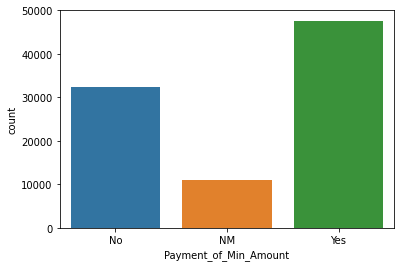

In [56]:
sns.countplot(data=df,x="Payment_of_Min_Amount")

## Amount_invested_monthly

In [57]:
def Amount_invested_monthly(col):
    if "__" in str(col):
        return str(col).split("__")[1]
    else:
        return str(col)

In [58]:
Amount_invested_monthly('__10000__')

'10000'

In [59]:
df["Amount_invested_monthly"]=df["Amount_invested_monthly"].apply(Amount_invested_monthly)

In [60]:
df["Amount_invested_monthly"]=df["Amount_invested_monthly"].astype("float")

## Payment_Behaviour

In [61]:
for i in df["Payment_Behaviour"]:
    print(i)

High_spent_Small_value_payments
Low_spent_Large_value_payments
Low_spent_Small_value_payments
High_spent_Medium_value_payments
!@9#%8
Low_spent_Small_value_payments
High_spent_Medium_value_payments
High_spent_Large_value_payments
High_spent_Large_value_payments
Low_spent_Medium_value_payments
Low_spent_Small_value_payments
High_spent_Large_value_payments
High_spent_Medium_value_payments
Low_spent_Small_value_payments
High_spent_Small_value_payments
Low_spent_Medium_value_payments
High_spent_Medium_value_payments
High_spent_Small_value_payments
High_spent_Small_value_payments
Low_spent_Large_value_payments
Low_spent_Small_value_payments
High_spent_Medium_value_payments
Low_spent_Small_value_payments
Low_spent_Large_value_payments
Low_spent_Large_value_payments
High_spent_Small_value_payments
!@9#%8
High_spent_Medium_value_payments
Low_spent_Medium_value_payments
High_spent_Medium_value_payments
High_spent_Small_value_payments
High_spent_Medium_value_payments
Low_spent_Small_value_paymen

High_spent_Medium_value_payments
Low_spent_Medium_value_payments
Low_spent_Medium_value_payments
High_spent_Large_value_payments
Low_spent_Small_value_payments
Low_spent_Small_value_payments
High_spent_Small_value_payments
Low_spent_Large_value_payments
Low_spent_Medium_value_payments
High_spent_Small_value_payments
High_spent_Small_value_payments
Low_spent_Large_value_payments
Low_spent_Small_value_payments
High_spent_Medium_value_payments
High_spent_Large_value_payments
Low_spent_Large_value_payments
High_spent_Small_value_payments
Low_spent_Large_value_payments
Low_spent_Small_value_payments
Low_spent_Small_value_payments
Low_spent_Small_value_payments
Low_spent_Small_value_payments
Low_spent_Small_value_payments
High_spent_Large_value_payments
Low_spent_Large_value_payments
Low_spent_Small_value_payments
Low_spent_Large_value_payments
Low_spent_Medium_value_payments
Low_spent_Small_value_payments
Low_spent_Small_value_payments
Low_spent_Large_value_payments
Low_spent_Small_value_pa

High_spent_Large_value_payments
Low_spent_Large_value_payments
High_spent_Large_value_payments
Low_spent_Large_value_payments
Low_spent_Large_value_payments
Low_spent_Small_value_payments
Low_spent_Small_value_payments
Low_spent_Large_value_payments
High_spent_Small_value_payments
High_spent_Medium_value_payments
Low_spent_Large_value_payments
Low_spent_Small_value_payments
Low_spent_Large_value_payments
High_spent_Medium_value_payments
Low_spent_Large_value_payments
Low_spent_Medium_value_payments
Low_spent_Medium_value_payments
High_spent_Small_value_payments
Low_spent_Medium_value_payments
Low_spent_Medium_value_payments
Low_spent_Small_value_payments
Low_spent_Medium_value_payments
High_spent_Medium_value_payments
!@9#%8
Low_spent_Large_value_payments
Low_spent_Large_value_payments
High_spent_Small_value_payments
High_spent_Large_value_payments
Low_spent_Large_value_payments
High_spent_Large_value_payments
High_spent_Medium_value_payments
Low_spent_Large_value_payments
Low_spent_Sm

In [62]:
df["Payment_Behaviour"].value_counts()

Low_spent_Small_value_payments      23204
High_spent_Medium_value_payments    15931
Low_spent_Medium_value_payments     12607
High_spent_Large_value_payments     12511
High_spent_Small_value_payments     10326
Low_spent_Large_value_payments       9476
!@9#%8                               6949
Name: Payment_Behaviour, dtype: int64

<AxesSubplot:xlabel='count', ylabel='Payment_Behaviour'>

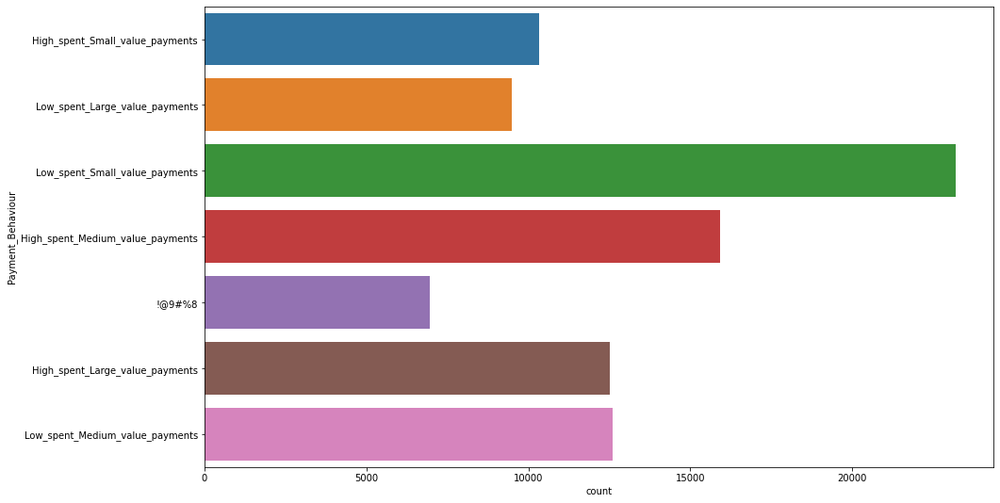

In [63]:
fig = plt.figure(figsize= (15,9))
sns.countplot(data=df,y="Payment_Behaviour")

## Monthly_Balance

In [64]:
for i in  df["Monthly_Balance"]:
    print(i)

312.49408867943663
284.62916249607184
223.45130972736786
341.48923103222177
340.4792117872438
244.5653167062043
358.12416760938714
484.5912142650067
466.46647639764313
465.6762241330048
444.8670318506144
481.505261949182
464.8806778859809
356.07810855965045
998.8692967863226
426.5134106068658
963.9215811205684
968.5555173846187
895.494583180492
433.6047729627723
409.95181177115995
411.42712287098345
262.4995942778403
359.37491550776383
443.5499567906391
379.21638114119577
288.60552234930395
460.88727561667037
392.1922656650829
438.5454315807922
482.6076383223166
497.6872787770267
394.31893393507744
364.00001570479753
740.1960900583389
698.8107657019921
270.66810874941655
690.9186643139128
633.0801749681799
510.36110048740534
796.2349097481042
858.462474411158
547.7604572149734
1038.5694068321734
899.1987716145285
963.2548189998564
1140.0673399198365
326.24183015224526
396.1113462137519
298.19215813115227
392.19618457022375
260.9124018324295
410.6743660782873
395.17338668866836
411.3068

872.8950718731243
nan
921.3684338137357
692.8740821361226
884.9639421466424
333.2237527652911
622.1720416661219
618.5993066644219
184.56705283851463
697.1063509260822
717.0375732042189
715.9471571034793
501.1697972568929
585.0158764691698
638.4676780858928
435.90106033721605
544.870342947551
113.56772058588724
448.1930934352549
579.7199783849347
277.9333787923674
319.9402951340261
319.03643358497226
334.73381684713627
252.7145463682661
351.13772252237504
292.1227172111832
536.6078864018283
945.8498753945734
977.7294884639307
1001.2534950551218
827.0204736846537
457.83504053710334
775.881240365992
458.5369009983374
418.0516960655768
177.62051276439283
304.68651751821994
356.53067764253683
264.0083129403336
229.3959388925811
299.02055175925943
365.7773841839677
352.9935937854335
238.17449594785043
242.28591397258614
259.7047298832236
267.7208751330672
264.70616020066564
545.9107667468811
736.0564220622467
532.4515151939837
626.9306599906877
274.99800093250497
527.3402833804877
766.603937

In [65]:
df[df["Monthly_Balance"]=='__-333333333333333333333333333__']

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
5545,0x367f,CUS_0x9885,February,Paul Dayl,17,186-49-9679,Developer,41086.40,3660.866667,3,...,Standard,113.98,34.826541,11 Years and 6 Months,Yes,145.544320,201.142993,Low_spent_Medium_value_payments,__-333333333333333333333333333__,Standard
26177,0xaf63,CUS_0x5a90,February,Scuffhamq,45,264-53-1943,Engineer,29728.31,2551.359167,3,...,Good,917.00,38.198076,31 Years and 9 Months,No,34.496445,198.611513,Low_spent_Large_value_payments,__-333333333333333333333333333__,Good
29158,0xc0d8,CUS_0x288d,July,Selamk,55,970-19-8342,Lawyer,30748.93,2572.410833,1,...,Good,860.97,40.634250,19 Years and 5 Months,No,43.727774,79.071807,High_spent_Small_value_payments,__-333333333333333333333333333__,Standard
38622,0xf84c,CUS_0x2b77,July,Longstretho,21,006-36-0111,Doctor,15167.62,1471.968333,4,...,Good,847.03,28.541848,NaN,NM,9.930809,128.875872,Low_spent_Small_value_payments,__-333333333333333333333333333__,Standard
60009,0x1759f,CUS_0xc06e,February,radenp,30,046-72-5387,Journalist,92114.68,7811.223333,3,...,Standard,820.52,39.089475,20 Years and 10 Months,Yes,54.219664,NaN,High_spent_Large_value_payments,__-333333333333333333333333333__,Standard
75251,0x1ceed,CUS_0x57f3,April,Kristen Haysq,29,577-85-0830,Mechanic,60904.59,NaN,3,...,Standard,2441.47,29.878716,12 Years and 11 Months,Yes,61.525140,394.893957,Low_spent_Small_value_payments,__-333333333333333333333333333__,Standard
82918,0x1fbd8,CUS_0x41bf,July,Doeringq,44,693-64-7611,Journalist,61990.52,4900.876667,10,...,Bad,3618.91,37.718591,13 Years and 8 Months,NM,355.143396,194.283488,Low_spent_Small_value_payments,__-333333333333333333333333333__,Standard
83255,0x1fdd1,CUS_0x2f7e,August,Sabina Zawadzkif,31,109-48-2095,Doctor,126353.04,10635.420000,4,...,Standard,859.77,28.442867,31 Years and 9 Months,No,167.043910,549.766139,Low_spent_Medium_value_payments,__-333333333333333333333333333__,Poor


In [66]:
df.drop(df[df["Monthly_Balance"]=='__-333333333333333333333333333__'].index,inplace=True)

In [67]:
df["Monthly_Balance"]=df["Monthly_Balance"].astype("float")

## Univariate analysis for numerical feature

In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90996 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        90996 non-null  object 
 1   Customer_ID               90996 non-null  object 
 2   Month                     90996 non-null  object 
 3   Name                      81904 non-null  object 
 4   Age                       90996 non-null  int32  
 5   SSN                       90996 non-null  object 
 6   Occupation                90996 non-null  object 
 7   Annual_Income             90996 non-null  float64
 8   Monthly_Inhand_Salary     77348 non-null  float64
 9   Num_Bank_Accounts         90996 non-null  int64  
 10  Num_Credit_Card           90996 non-null  int64  
 11  Interest_Rate             90996 non-null  int64  
 12  Num_of_Loan               90996 non-null  int32  
 13  Type_of_Loan              80696 non-null  object 
 14  Delay_

In [69]:
df.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,90996.000000,9.099600e+04,77348.000000,90996.000000,90996.000000,90996.000000,90996.000000,90996.000000,84630.000000,90996.000000,89197.000000,90996.000000,90996.000000,90996.000000,86929.000000,89887.000000
mean,120.187646,1.757929e+05,4193.647218,17.013121,22.403139,73.011946,3.002923,21.087334,31.086352,10.463835,27.767571,1426.447460,32.279820,1391.066634,636.035947,402.394283
std,688.465227,1.425748e+06,3185.387262,117.119258,128.635594,468.831323,62.581935,14.873119,227.075595,6.672775,193.136328,1154.917281,5.112244,8254.056573,2040.204978,213.818113
min,14.000000,7.005930e+03,303.645417,-1.000000,0.000000,1.000000,-100.000000,-5.000000,-3.000000,0.000000,0.000000,0.230000,20.000000,0.000000,0.000000,0.007760
25%,25.000000,1.943348e+04,1625.023750,3.000000,4.000000,8.000000,1.000000,10.000000,9.000000,5.340000,3.000000,565.720000,28.051176,30.453014,74.416501,270.025828
50%,34.000000,3.757861e+04,3089.424167,6.000000,5.000000,13.000000,3.000000,18.000000,14.000000,9.410000,6.000000,1166.640000,32.295343,69.385992,135.819415,336.584352
75%,42.000000,7.281702e+04,5961.745000,7.000000,7.000000,20.000000,5.000000,28.000000,18.000000,14.870000,9.000000,1948.980000,36.489823,161.978219,265.545449,469.937509
max,8698.000000,2.419806e+07,15204.633333,1798.000000,1499.000000,5797.000000,1496.000000,67.000000,4397.000000,36.970000,2597.000000,4998.070000,50.000000,82331.000000,10000.000000,1602.040519


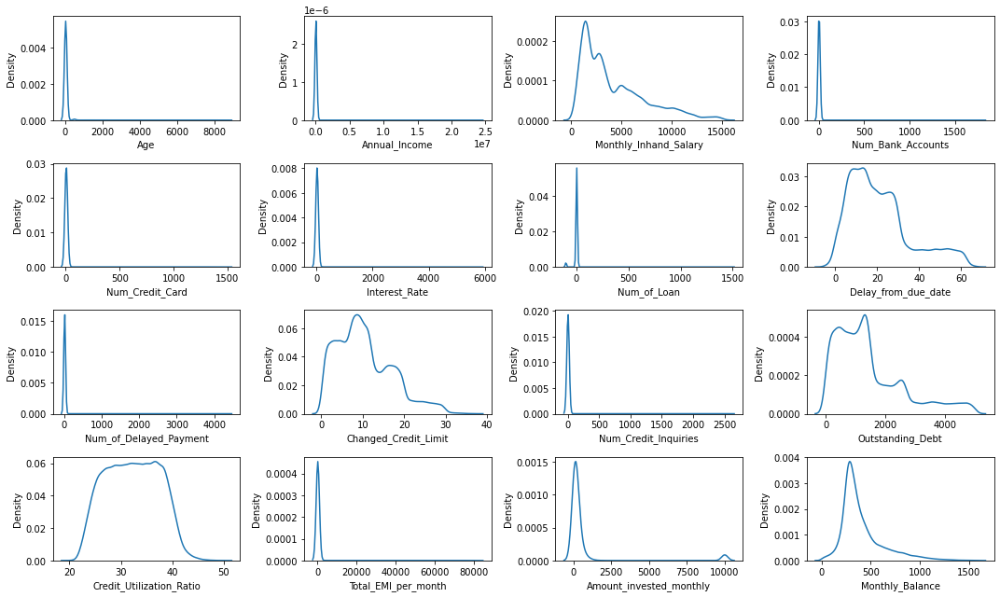

In [70]:
num_cols = df.select_dtypes(exclude='object').columns
fig = plt.figure(figsize= (15,9))
for i, col in enumerate(num_cols):
    
    ax=fig.add_subplot(4,4,i+1)
    
    sns.kdeplot(x=df[col], ax=ax)
    
fig.tight_layout()  
plt.show()

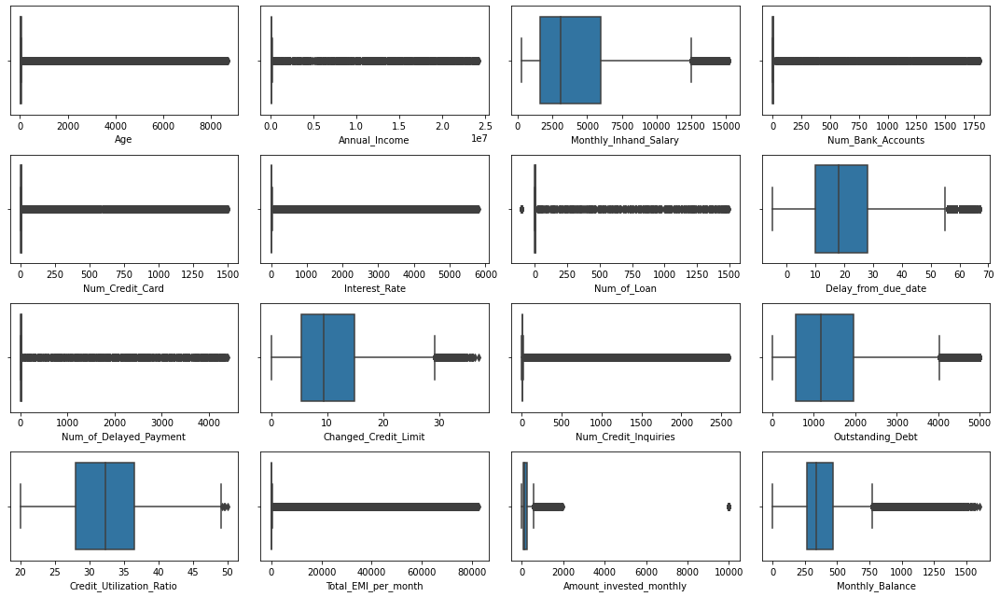

In [71]:
num_cols = df.select_dtypes(exclude='object').columns
fig = plt.figure(figsize= (15,9))
for i, col in enumerate(num_cols):
    
    ax=fig.add_subplot(4,4,i+1)
    
    sns.boxplot(x=df[col], ax=ax)
    
fig.tight_layout()  
plt.show()

## Check Missing Values

In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90996 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        90996 non-null  object 
 1   Customer_ID               90996 non-null  object 
 2   Month                     90996 non-null  object 
 3   Name                      81904 non-null  object 
 4   Age                       90996 non-null  int32  
 5   SSN                       90996 non-null  object 
 6   Occupation                90996 non-null  object 
 7   Annual_Income             90996 non-null  float64
 8   Monthly_Inhand_Salary     77348 non-null  float64
 9   Num_Bank_Accounts         90996 non-null  int64  
 10  Num_Credit_Card           90996 non-null  int64  
 11  Interest_Rate             90996 non-null  int64  
 12  Num_of_Loan               90996 non-null  int32  
 13  Type_of_Loan              80696 non-null  object 
 14  Delay_

In [73]:
df.isna().sum()

ID                              0
Customer_ID                     0
Month                           0
Name                         9092
Age                             0
SSN                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       13648
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                10300
Delay_from_due_date             0
Num_of_Delayed_Payment       6366
Changed_Credit_Limit            0
Num_Credit_Inquiries         1799
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8231
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4067
Payment_Behaviour               0
Monthly_Balance              1109
Credit_Score                    0
dtype: int64

In [74]:
df.isna().mean()*100

ID                           0.000000
Customer_ID                  0.000000
Month                        0.000000
Name                         9.991648
Age                          0.000000
SSN                          0.000000
Occupation                   0.000000
Annual_Income                0.000000
Monthly_Inhand_Salary       14.998461
Num_Bank_Accounts            0.000000
Num_Credit_Card              0.000000
Interest_Rate                0.000000
Num_of_Loan                  0.000000
Type_of_Loan                11.319179
Delay_from_due_date          0.000000
Num_of_Delayed_Payment       6.995912
Changed_Credit_Limit         0.000000
Num_Credit_Inquiries         1.977010
Credit_Mix                   0.000000
Outstanding_Debt             0.000000
Credit_Utilization_Ratio     0.000000
Credit_History_Age           9.045453
Payment_of_Min_Amount        0.000000
Total_EMI_per_month          0.000000
Amount_invested_monthly      4.469427
Payment_Behaviour            0.000000
Monthly_Bala

<AxesSubplot:>

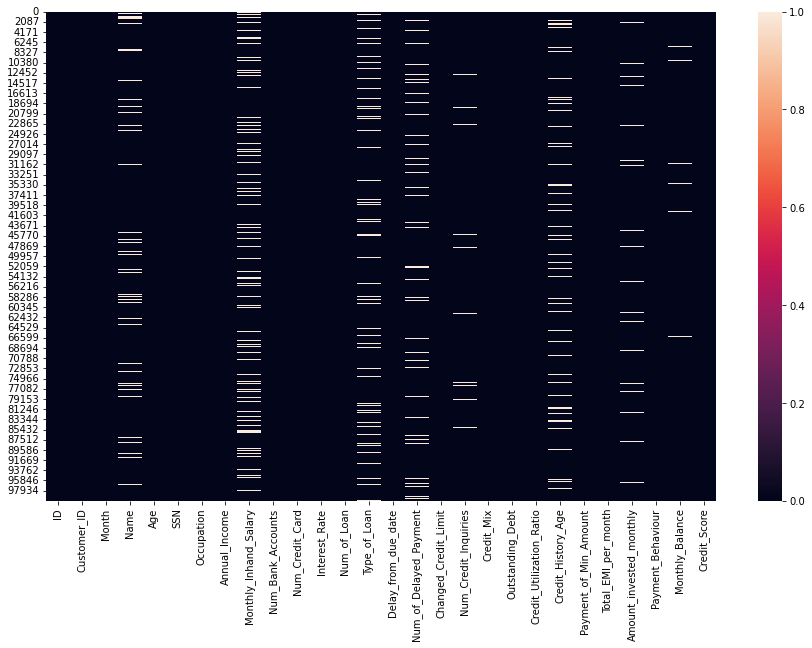

In [75]:
fig = plt.figure(figsize= (15,9))
sns.heatmap(df.isna())

## Detect outliers and split df to outliers and clean then analyze outliers df.

In [76]:
from datasist.structdata import detect_outliers

In [77]:
outliers_indices = detect_outliers(df, 0 ,list(df.select_dtypes(exclude="object").columns))
len(outliers_indices)

24767

In [78]:
df.drop(outliers_indices, inplace=True)
df

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Standard,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.280222,Low_spent_Large_value_payments,284.629162,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153,High_spent_Medium_value_payments,341.489231,Good
5,0x1607,CUS_0xd40,June,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.430172,!@9#%8,340.479212,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,0x25fe8,CUS_0x942c,March,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Standard,502.38,39.323569,31 Years and 5 Months,No,35.104023,140.581403,High_spent_Medium_value_payments,410.256158,Poor
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Standard,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.971333,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Standard,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.185950,High_spent_Medium_value_payments,496.651610,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,33.638208,31 Years and 9 Months,No,35.104023,251.672582,Low_spent_Large_value_payments,319.164979,Standard


In [79]:
df.select_dtypes(include="object").columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'SSN', 'Occupation',
       'Type_of_Loan', 'Credit_Mix', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_Score'],
      dtype='object')

In [80]:
df.select_dtypes(exclude="object").columns

Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance'],
      dtype='object')

## Bivariate Categorical Analysis

<AxesSubplot:xlabel='Occupation', ylabel='count'>

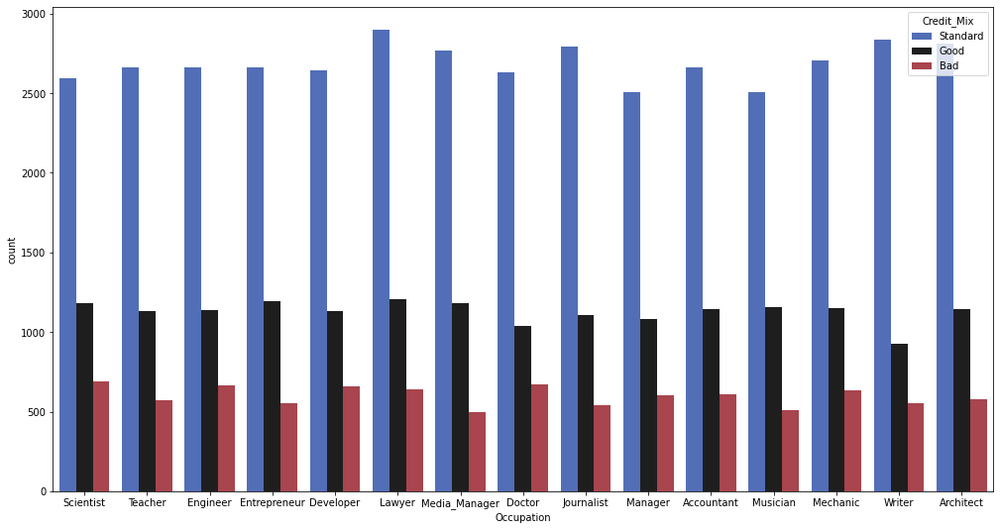

In [81]:
fig = plt.figure(figsize= (17,9))
sns.countplot(data=df,x="Occupation",hue="Credit_Mix",palette="icefire")

<AxesSubplot:xlabel='Occupation', ylabel='count'>

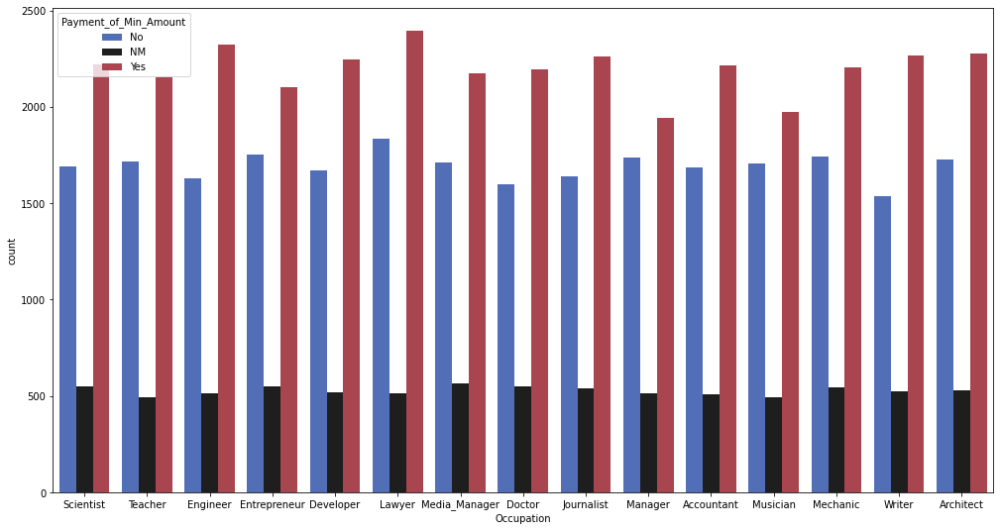

In [82]:
fig = plt.figure(figsize= (17,9))
sns.countplot(data=df,x="Occupation",hue="Payment_of_Min_Amount",palette="icefire")

<AxesSubplot:xlabel='Occupation', ylabel='count'>

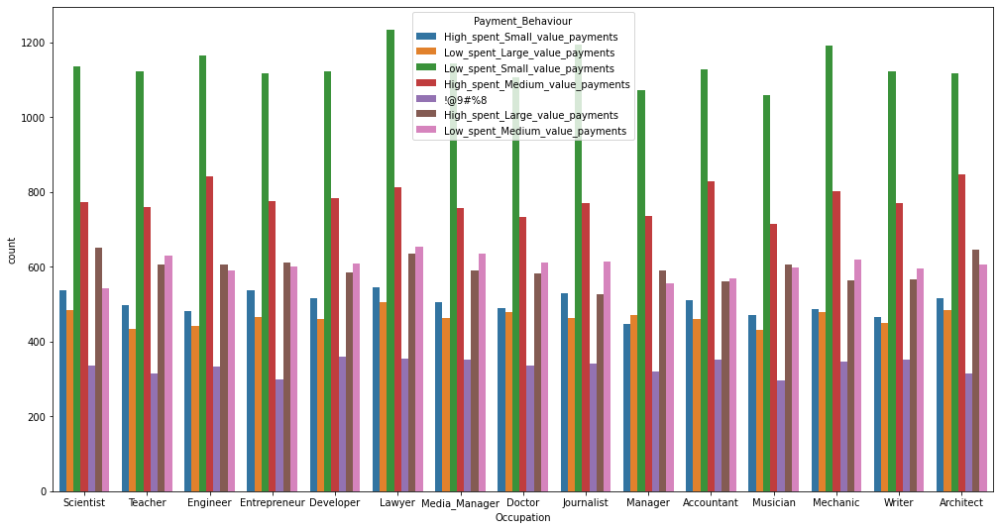

In [83]:
fig = plt.figure(figsize= (17,9))
sns.countplot(data=df,x="Occupation",hue="Payment_Behaviour")

<AxesSubplot:xlabel='Occupation', ylabel='count'>

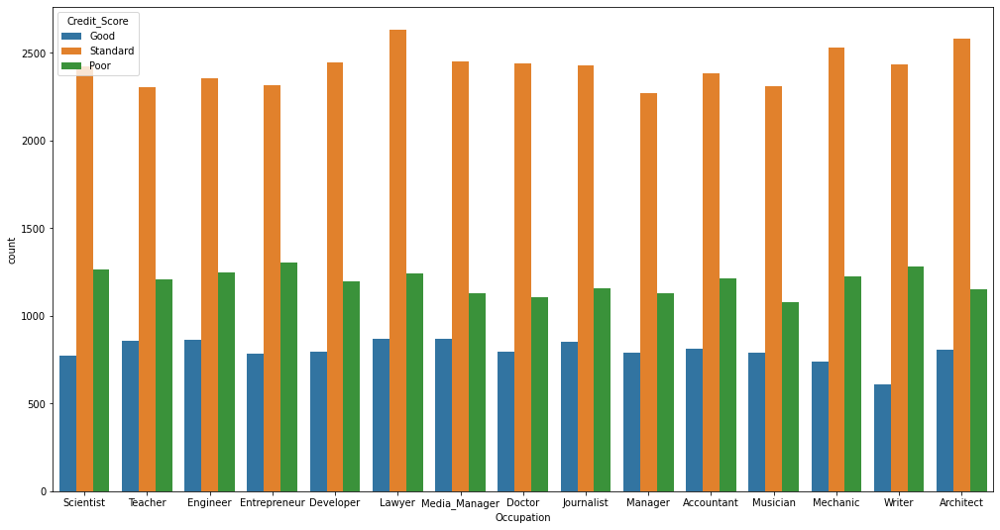

In [84]:
fig = plt.figure(figsize= (17,9))
sns.countplot(data=df,x="Occupation",hue="Credit_Score")

## Bivariate Numerical Analysis

In [85]:
df.select_dtypes(exclude="object").columns

Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance'],
      dtype='object')

In [86]:
#sns.pairplot(data=df)

In [87]:
df.corr()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
Age,1.000000,0.089052,0.086974,-0.173177,-0.131645,-0.204157,-0.194869,-0.163879,0.001895,-0.154795,-0.006444,-0.194503,0.022002,-0.070548,0.002396,0.106343
Annual_Income,0.089052,1.000000,0.998238,-0.237769,-0.186511,-0.268562,-0.258748,-0.212189,0.004537,-0.144248,-0.010523,-0.255834,0.163515,0.472020,0.054346,0.707793
Monthly_Inhand_Salary,0.086974,0.998238,1.000000,-0.236362,-0.185108,-0.268074,-0.256646,-0.212297,0.003497,-0.142419,-0.010859,-0.256312,0.160436,0.471850,0.057510,0.708111
Num_Bank_Accounts,-0.173177,-0.237769,-0.236362,1.000000,0.400027,0.548046,0.414986,0.530192,0.010591,0.289553,0.007822,0.457187,-0.055557,0.090100,-0.020821,-0.240054
Num_Credit_Card,-0.131645,-0.186511,-0.185108,0.400027,1.000000,0.457309,0.362515,0.435212,0.007042,0.199250,0.005589,0.446140,-0.041389,0.092688,-0.010641,-0.191213
Interest_Rate,-0.204157,-0.268562,-0.268074,0.548046,0.457309,1.000000,0.507823,0.542123,0.009659,0.329565,0.012886,0.605967,-0.061825,0.124280,-0.012988,-0.278944
Num_of_Loan,-0.194869,-0.258748,-0.256646,0.414986,0.362515,0.507823,1.000000,0.435225,0.006479,0.305330,0.009655,0.569951,-0.088730,0.494839,-0.013880,-0.414038
Delay_from_due_date,-0.163879,-0.212189,-0.212297,0.530192,0.435212,0.542123,0.435225,1.000000,0.011408,0.244580,0.010436,0.511553,-0.053337,0.116294,-0.010626,-0.225653
Num_of_Delayed_Payment,0.001895,0.004537,0.003497,0.010591,0.007042,0.009659,0.006479,0.011408,1.000000,0.002799,0.000416,0.006700,-0.000228,0.008886,0.000037,0.000717
Changed_Credit_Limit,-0.154795,-0.144248,-0.142419,0.289553,0.199250,0.329565,0.305330,0.244580,0.002799,1.000000,0.005238,0.360408,-0.037255,0.097340,-0.005150,-0.164335


<AxesSubplot:>

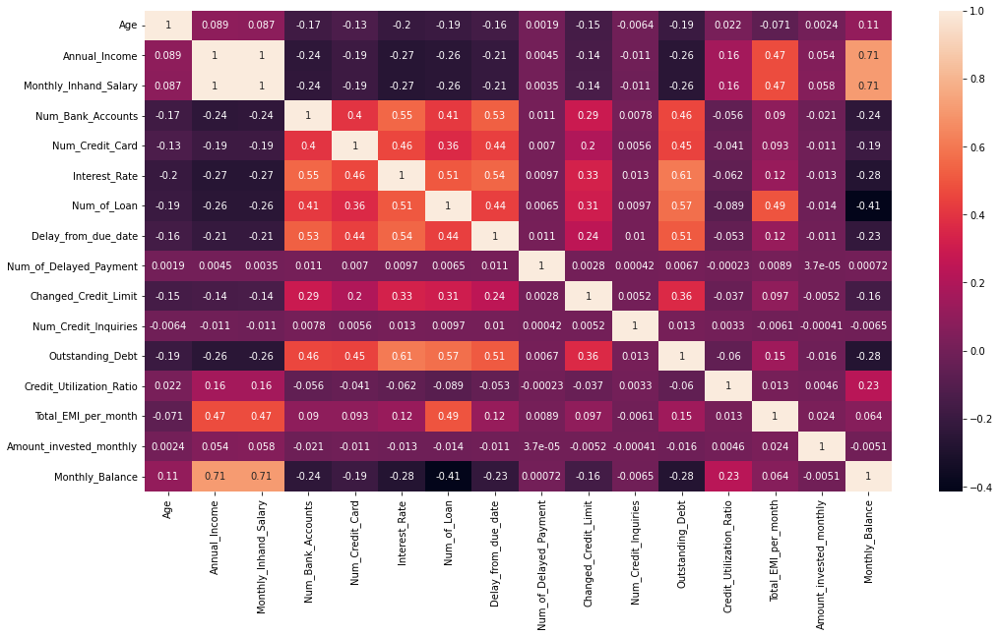

In [88]:
plt.figure(figsize= (17,9))
sns.heatmap(df.corr(),annot=True)

##  Bivariate Numerical With Categorical Analysis

In [89]:
df.select_dtypes(exclude="object").columns

Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance'],
      dtype='object')

In [90]:
df.select_dtypes(include="object").columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'SSN', 'Occupation',
       'Type_of_Loan', 'Credit_Mix', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_Score'],
      dtype='object')

In [91]:
df.groupby("Occupation").mean()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
Occupation,,,,,,,,,,,,,,,,
Accountant,33.907504,48673.838398,4058.827381,5.129676,5.397642,13.775334,3.222625,18.988891,30.205724,10.326395,29.331714,1235.698563,32.305375,88.413819,617.024473,405.178182
Architect,33.661155,49433.492177,4104.105369,5.146605,5.328704,13.254189,3.140873,18.710317,30.002854,9.741779,23.802691,1144.746122,32.262663,85.676725,614.716689,410.155933
Developer,33.622408,48279.185362,4003.826642,5.164563,5.451307,13.899008,3.300271,19.010370,29.333171,10.157000,30.601613,1246.627996,32.275323,86.216188,600.389134,405.640347
Doctor,33.686406,47780.945979,3949.029255,5.173272,5.288710,13.428571,3.393318,18.963364,29.555858,9.707313,30.716675,1216.975415,32.130731,91.492263,592.314282,396.771453
Engineer,32.903855,48729.625831,4086.385181,5.184895,5.313761,13.734424,3.257284,19.059839,28.820691,10.240605,26.783135,1248.690955,32.343722,84.703847,637.955677,404.523382
Entrepreneur,33.788566,48447.855583,4034.300584,5.195327,5.414020,13.668103,3.304673,18.879991,32.145477,9.404215,34.505207,1179.973566,32.269948,88.141230,608.907124,397.512379
Journalist,34.382346,46093.463595,3824.060907,5.211889,5.434587,13.730241,3.124747,18.226976,28.061378,9.901052,29.459789,1246.996688,32.187327,81.577460,607.820958,394.889635
Lawyer,34.351825,47268.211937,3969.155035,5.096182,5.330943,13.647543,3.212613,19.122548,29.511464,9.927939,23.594815,1177.717758,32.142562,82.770908,620.385222,399.193719
Manager,33.272120,49460.078412,4121.596678,5.170522,5.266396,14.114715,3.176008,19.020987,36.415282,9.801920,26.327829,1231.220317,32.494246,82.818979,633.121884,411.630624


<AxesSubplot:ylabel='Occupation'>

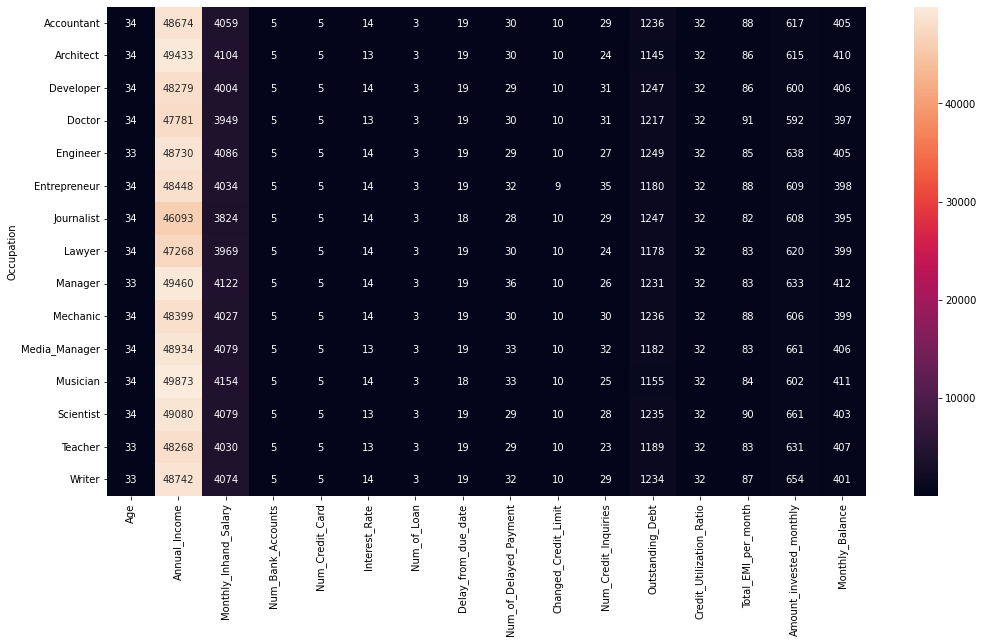

In [92]:
plt.figure(figsize= (17,9))
sns.heatmap(df.groupby("Occupation").mean(),annot=True,fmt='.0f')

In [93]:
df.groupby("Credit_Mix").median()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
Credit_Mix,,,,,,,,,,,,,,,,
Bad,30.0,20127.72,1745.873333,8.0,7.0,24.0,6.0,35.0,20.0,9.49,10.0,2536.58,31.665459,85.558903,101.244418,276.521887
Good,37.0,43108.40,3614.863333,3.0,4.0,6.0,2.0,9.0,7.0,6.07,3.0,726.60,32.791599,50.874832,163.002649,406.906727
Standard,33.0,34982.14,2918.759167,6.0,5.0,14.0,3.0,18.0,14.0,10.54,5.0,1035.70,32.196192,57.373608,131.280195,341.165609


<AxesSubplot:ylabel='Credit_Mix'>

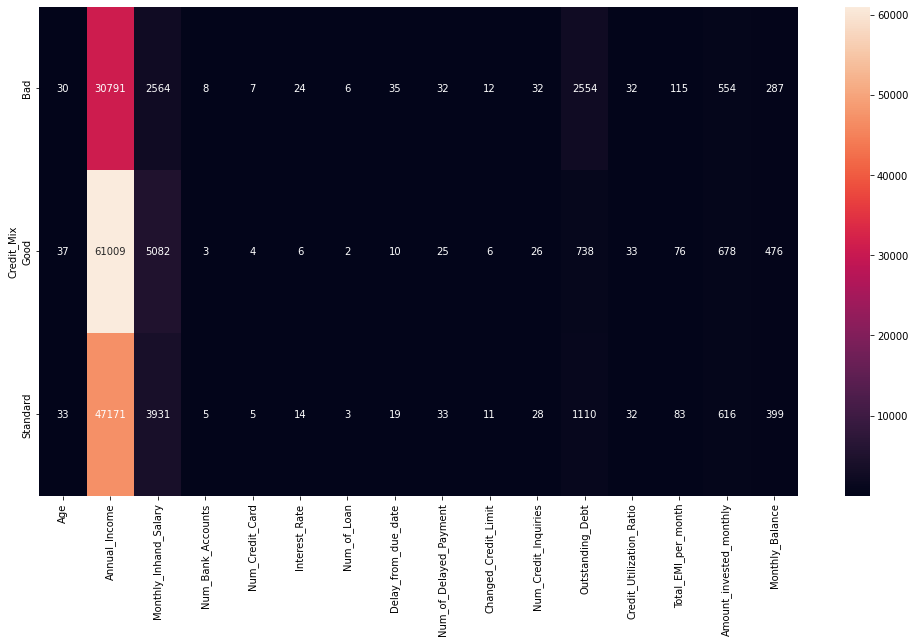

In [94]:
plt.figure(figsize= (17,9))
sns.heatmap(df.groupby("Credit_Mix").mean(),annot=True,fmt='.0f')

In [95]:
df.groupby("Payment_of_Min_Amount").median()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
Payment_of_Min_Amount,,,,,,,,,,,,,,,,
NM,33.0,35933.67,2990.772083,5.0,5.0,12.0,3.0,17.0,13.0,9.09,5.0,1078.74,32.301163,60.660111,135.336550,342.651647
No,37.0,42468.06,3565.411667,4.0,5.0,8.0,2.0,11.0,9.0,6.18,3.0,724.57,32.663921,49.469287,158.470614,400.376419
Yes,31.0,31439.60,2610.171667,6.0,6.0,18.0,4.0,23.0,16.0,12.29,7.0,1433.03,31.982947,67.127916,117.544480,309.763038


<AxesSubplot:ylabel='Payment_of_Min_Amount'>

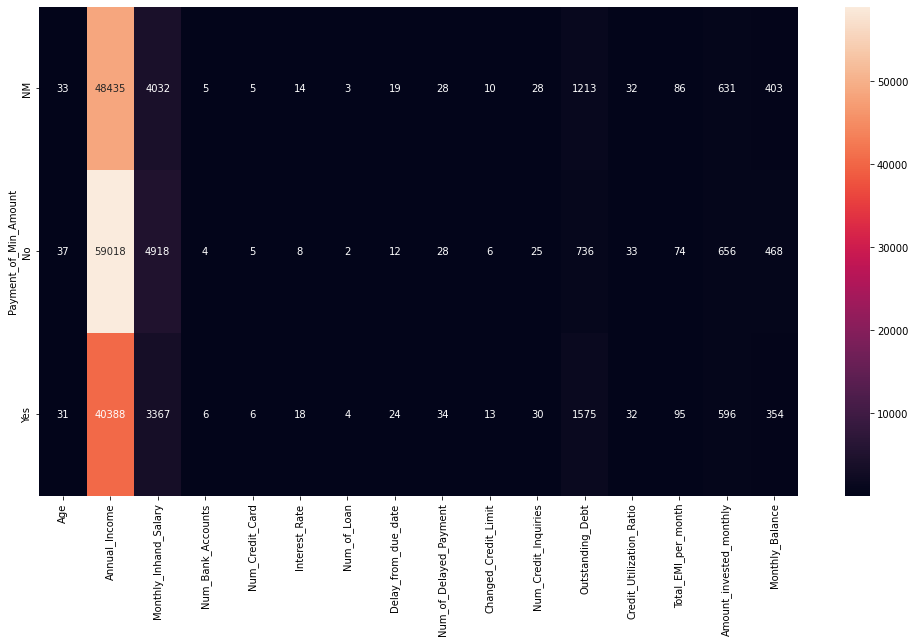

In [96]:
plt.figure(figsize= (17,9))
sns.heatmap(df.groupby("Payment_of_Min_Amount").mean(),annot=True,fmt='.0f')

In [97]:
df.groupby("Payment_Behaviour").mean()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
Payment_Behaviour,,,,,,,,,,,,,,,,
!@9#%8,33.649820,48226.534852,4036.050708,5.239912,5.383540,13.670595,3.261286,19.096884,28.698574,9.740124,27.038414,1215.435132,32.212742,85.813574,630.127428,403.364307
High_spent_Large_value_payments,34.288289,69910.934066,5805.239755,4.791872,5.142745,12.188088,2.854232,17.107255,36.977962,9.356122,25.670090,1056.161468,33.519675,109.869217,532.656126,620.830711
High_spent_Medium_value_payments,33.929273,55272.228576,4612.764353,5.024259,5.277612,13.131460,3.069787,18.237209,30.613057,9.753286,25.008088,1152.674443,32.810442,98.707104,540.644513,492.393171
High_spent_Small_value_payments,33.696511,47580.158703,3968.277312,5.098024,5.374718,13.612946,3.245789,18.683380,25.952987,9.884686,26.312686,1200.633283,32.258211,87.134185,613.020243,400.627463
Low_spent_Large_value_payments,33.716927,45287.789010,3776.956629,5.165831,5.342124,13.513688,3.188476,18.719794,30.249614,9.928871,27.147072,1192.861558,31.864227,81.324489,691.684446,347.481309
Low_spent_Medium_value_payments,33.762147,51530.033529,4319.177208,5.175872,5.328943,13.717543,3.198340,18.747316,27.939520,9.795524,28.974124,1206.094283,31.996805,85.173941,706.488205,349.032336
Low_spent_Small_value_payments,33.136324,32756.503355,2715.956550,5.470087,5.530911,14.814360,3.520167,20.354371,31.752284,10.315710,32.838920,1344.078422,31.581183,65.695101,657.178933,278.088501


<AxesSubplot:ylabel='Payment_Behaviour'>

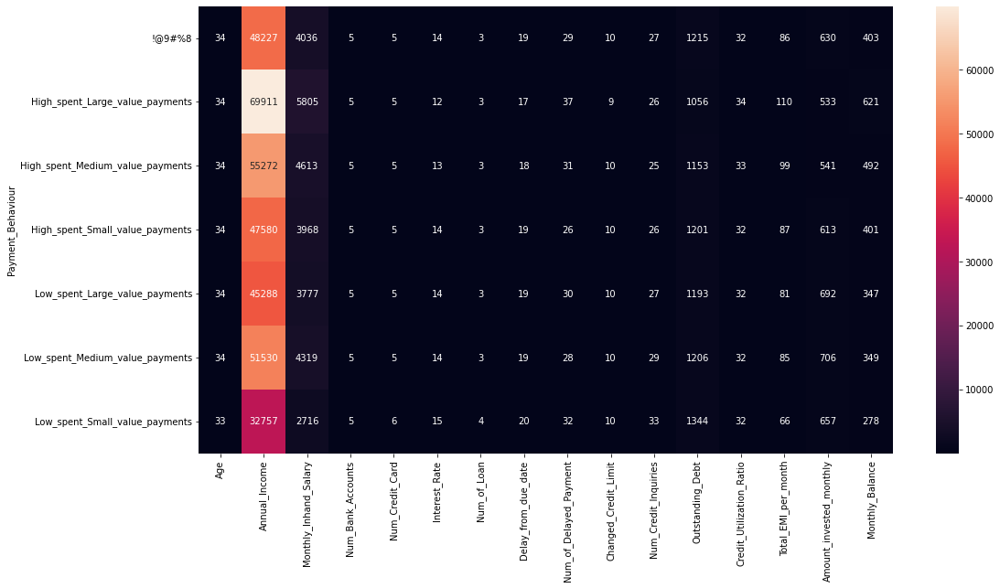

In [98]:
plt.figure(figsize= (17,9))
sns.heatmap(df.groupby("Payment_Behaviour").mean(),annot=True,fmt='.0f')

In [99]:
df.groupby('Credit_Score').mean()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
Credit_Score,,,,,,,,,,,,,,,,
Good,36.663726,58302.362393,4850.330964,3.397687,4.112341,7.446701,2.137971,10.567613,25.857463,7.010989,25.509802,768.082758,32.562726,79.103559,659.830159,453.421831
Poor,31.445219,39645.718717,3298.997051,6.273904,6.439697,19.326676,4.391777,26.196195,32.394132,10.484784,31.242223,1802.807892,32.018882,95.862887,595.973201,353.188910
Standard,33.797663,49601.083857,4136.175464,5.207711,5.235104,12.905142,3.001461,17.992063,31.441533,10.536096,27.549649,1064.603330,32.299361,82.960643,624.437927,412.001005


<AxesSubplot:ylabel='Credit_Score'>

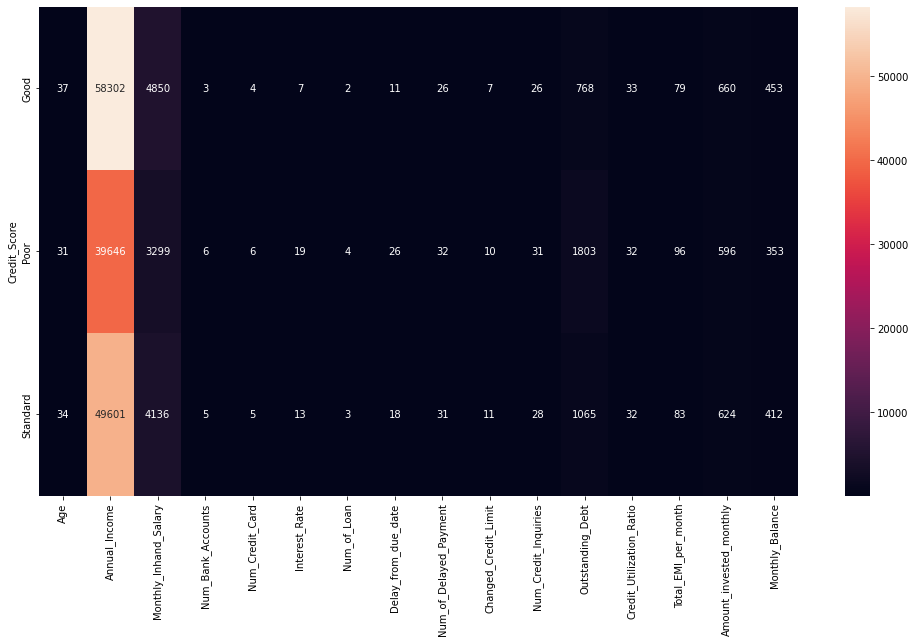

In [100]:
plt.figure(figsize= (17,9))
sns.heatmap(df.groupby('Credit_Score').mean(),annot=True,fmt='.0f')

## Classical Machine learning  Models

In [101]:
#df.head()

In [115]:
df.drop(["ID","Customer_ID","Month","Name","SSN","Credit_History_Age","Type_of_Loan"],axis = 1,inplace = True)

In [103]:
#df.info()

In [104]:
#from sklearn.impute import KNNImputer
#imputer = KNNImputer()

In [105]:
#df[["Monthly_Inhand_Salary","Num_of_Delayed_Payment","Num_Credit_Inquiries","Amount_invested_monthly","Monthly_Balance"]]=imputer.fit_transform(df[["Monthly_Inhand_Salary","Num_of_Delayed_Payment","Num_Credit_Inquiries","Amount_invested_monthly","Monthly_Balance"]])

In [106]:
#df.info()

In [107]:
#df = pd.get_dummies(df, columns=["Occupation","Credit_Mix","Payment_of_Min_Amount","Payment_Behaviour"], drop_first=True)

In [108]:
#df

In [116]:
x=df.drop(columns="Credit_Score")
y=df["Credit_Score"]

In [117]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 66229 entries, 0 to 99999
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       66229 non-null  int32  
 1   Occupation                66229 non-null  object 
 2   Annual_Income             66229 non-null  float64
 3   Monthly_Inhand_Salary     56276 non-null  float64
 4   Num_Bank_Accounts         66229 non-null  int64  
 5   Num_Credit_Card           66229 non-null  int64  
 6   Interest_Rate             66229 non-null  int64  
 7   Num_of_Loan               66229 non-null  int32  
 8   Delay_from_due_date       66229 non-null  int64  
 9   Num_of_Delayed_Payment    61599 non-null  float64
 10  Changed_Credit_Limit      66229 non-null  float64
 11  Num_Credit_Inquiries      64936 non-null  float64
 12  Credit_Mix                66229 non-null  object 
 13  Outstanding_Debt          66229 non-null  float64
 14  Credit

In [118]:
y.value_counts()* 100 / len(df)

Standard    54.788688
Poor        27.066693
Good        18.144619
Name: Credit_Score, dtype: float64

In [119]:
from sklearn.model_selection import train_test_split
x_train ,x_test ,y_train,y_test = train_test_split(x,y,test_size = 0.2,random_state=42,stratify=y)

In [113]:
#from sklearn.preprocessing import StandardScaler

In [120]:
#ss = StandardScaler()
#X_train_ss = ss.fit_transform(x_train)
#X_test_ss = ss.transform(x_test)

##  LogisticRegression Model

In [ ]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()

In [ ]:
from sklearn.metrics import classification_report
lr.fit(X_train_ss,y_train)
y_pre=lr.predict(X_test_ss)

In [ ]:
lr.score(X_train_ss,y_train)

In [ ]:
print(classification_report(y_test,y_pre))

##  Naive_bayes Model

In [ ]:
from sklearn.naive_bayes import GaussianNB
nb=GaussianNB()

In [ ]:
nb.fit(X_train_ss,y_train)
y_pre=nb.predict(X_test_ss)

In [ ]:
print(classification_report(y_test,y_pre))

In [ ]:
nb.score(X_train_ss,y_train)

##  knn Model

In [ ]:
#from sklearn.neighbors import KNeighborsClassifier

In [ ]:
''''score_list = []
for k in range(1,15):
    knn= KNeighborsClassifier(n_neighbors =k)
    knn.fit(X_train_ss,y_train)
    score_list.append(knn.score(X_test_ss, y_test))

plt.plot(range(1,15), score_list)
plt.xlabel("k values")
plt.ylabel("Accuracy")
plt.show()

## Svm Model

In [ ]:
#from sklearn.svm import SVC
#svm = SVC(kernel='linear')

In [ ]:
#svm.fit(X_train_ss,y_train)
#y_pre=svm.predict(X_test_ss)

In [ ]:
#print(classification_report(y_test,y_pre))

## DecisionTreeClassifier Model

In [ ]:
#from sklearn.tree import DecisionTreeClassifier
#dt=DecisionTreeClassifier()

In [ ]:
#dt.fit(X_train_ss,y_train)
#y_pre=dt.predict(X_test_ss)

In [ ]:
#print(classification_report(y_test,y_pre))

##  Random Forest Model

In [ ]:
#from sklearn.ensemble import RandomForestClassifier

In [ ]:
#rf=RandomForestClassifier()

In [ ]:
#rf.fit(X_train_ss,y_train)
#y_pre=rf.predict(X_test_ss)
#print(classification_report(y_test,y_pre))

## AdaBoostClassifier

In [ ]:
#from sklearn.ensemble import AdaBoostClassifier
#ada=AdaBoostClassifier()

In [ ]:
#ada.fit(X_train_ss,y_train)
#y_pre=ada.predict(X_test_ss)
#print(classification_report(y_test,y_pre))

## XGboost Model

In [ ]:
#from sklearn.ensemble import GradientBoostingClassifier
#xg=GradientBoostingClassifier()

In [ ]:
#xg.fit(X_train_ss,y_train)
#y_pre=xg.predict(X_test_ss)
#print(classification_report(y_test,y_pre))

## Final Pipeline

In [121]:
numeric_columns = x_train.select_dtypes(exclude='object').columns
numeric_columns

Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance'],
      dtype='object')

In [122]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
numeric_feature = Pipeline(steps=[('handlingmissing',SimpleImputer(strategy='median')),('scaling',StandardScaler(with_mean=False))])

In [123]:
cat_columns = x_train.select_dtypes(include='object').columns
cat_columns

Index(['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount',
       'Payment_Behaviour'],
      dtype='object')

In [124]:
from sklearn.preprocessing import OneHotEncoder
cat_feature = Pipeline(steps = [('missing',SimpleImputer(strategy='most_frequent')),('encoding',OneHotEncoder()),('scaling',StandardScaler(with_mean=False))])

In [125]:
from sklearn.compose import ColumnTransformer
processing = ColumnTransformer([('numeic',numeric_feature,numeric_columns),
                                ('cat', cat_feature, cat_columns)])

In [126]:
processing

ColumnTransformer(transformers=[('numeic',
                                 Pipeline(steps=[('handlingmissing',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaling',
                                                  StandardScaler(with_mean=False))]),
                                 Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'N..._Utilization_Ratio',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance'],
      dtype='object')),
                                ('cat',
                                 Pipeline(steps=[('missing',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('encoding', OneHotEncoder()),
 

In [127]:
from sklearn.ensemble import RandomForestClassifier

In [128]:
final_pipe= Pipeline(steps = [('processing',processing),('modeling',RandomForestClassifier())])

In [129]:
final_pipe.fit(x_train,y_train)

Pipeline(steps=[('processing',
                 ColumnTransformer(transformers=[('numeic',
                                                  Pipeline(steps=[('handlingmissing',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaling',
                                                                   StandardScaler(with_mean=False))]),
                                                  Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Paym...
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('missing',
                                                                 

In [130]:
from sklearn.metrics import classification_report
y_pred =final_pipe.predict(x_test)

In [131]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

        Good       0.72      0.69      0.71      2404
        Poor       0.79      0.78      0.78      3585
    Standard       0.81      0.82      0.81      7257

    accuracy                           0.79     13246
   macro avg       0.77      0.76      0.77     13246
weighted avg       0.79      0.79      0.79     13246



In [132]:
final_pipe.fit(x_train,y_train).score(x_train,y_train)

1.0

In [133]:
final_pipe.fit(x_train,y_train).score(x_test,y_test)

0.7890683980069455

In [135]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 66229 entries, 0 to 99999
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       66229 non-null  int32  
 1   Occupation                66229 non-null  object 
 2   Annual_Income             66229 non-null  float64
 3   Monthly_Inhand_Salary     56276 non-null  float64
 4   Num_Bank_Accounts         66229 non-null  int64  
 5   Num_Credit_Card           66229 non-null  int64  
 6   Interest_Rate             66229 non-null  int64  
 7   Num_of_Loan               66229 non-null  int32  
 8   Delay_from_due_date       66229 non-null  int64  
 9   Num_of_Delayed_Payment    61599 non-null  float64
 10  Changed_Credit_Limit      66229 non-null  float64
 11  Num_Credit_Inquiries      64936 non-null  float64
 12  Credit_Mix                66229 non-null  object 
 13  Outstanding_Debt          66229 non-null  float64
 14  Credit

In [134]:
import joblib
save = joblib.dump(final_pipe,'creditScore.pkl')

In [136]:
%%writefile main.py
import numpy as np
import pandas as pd
import streamlit as st 
import joblib

classifier=joblib.load('creditScore.pkl')


def welcome():
    return "Welcome All"


def predict_CreditScore(Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance ):

    prediction=classifier.predict(pd.DataFrame({'Age':[Age],'Occupation':[Occupation],"Annual_Income":[Annual_Income],"Monthly_Inhand_Salary":[Monthly_Inhand_Salary],'Num_Bank_Accounts':[Num_Bank_Accounts],'Num_Credit_Card':[Num_Credit_Card],'Interest_Rate':[Interest_Rate],"Num_of_Loan":[Num_of_Loan],"Delay_from_due_date":[Delay_from_due_date],"Num_of_Delayed_Payment":[Num_of_Delayed_Payment],"Changed_Credit_Limit":[Changed_Credit_Limit],"Num_Credit_Inquiries":[Num_Credit_Inquiries],"Credit_Mix":[Credit_Mix],"Outstanding_Debt":[Outstanding_Debt],"Credit_Utilization_Ratio":[Credit_Utilization_Ratio],"Payment_of_Min_Amount":[Payment_of_Min_Amount],"Total_EMI_per_month":[Total_EMI_per_month],"Amount_invested_monthly":[Amount_invested_monthly],"Payment_Behaviour":[Payment_Behaviour],"Monthly_Balance":[Monthly_Balance]}))

    return prediction
  
      
def main():
    st.title("Credit Score Classification")
    html_temp = """
    <div style="background-color:tomato;padding:10px">
    <h2 style="color:white;text-align:center;">Streamlit Credit Score Classification ML App </h2>
    </div>
    """
    st.markdown(html_temp,unsafe_allow_html=True)
    Age= st.text_input("Age","Type Here")
    Occupation= st.text_input("Occupation","Type Here")
    Annual_Income= st.text_input("Annual_Income","Type Here")
    Monthly_Inhand_Salary = st.text_input("Monthly_Inhand_Salary","Type Here")
    Num_Bank_Accounts= st.text_input("Num_Bank_Accounts","Type Here")
    Num_Credit_Card= st.text_input("Num_Credit_Card","Type Here")
    Interest_Rate= st.text_input("Interest_Rate","Type Here")
    Num_of_Loan= st.text_input("Num_of_Loan","Type Here")
    Delay_from_due_date = st.text_input("Delay_from_due_date","Type Here")
    Num_of_Delayed_Payment= st.text_input("Num_of_Delayed_Payment","Type Here")
    Changed_Credit_Limit = st.text_input("Changed_Credit_Limit","Type Here")
    Num_Credit_Inquiries = st.text_input("Num_Credit_Inquiries","Type Here")
    Credit_Mix = st.text_input("Credit_Mix","Type Here")
    Outstanding_Debt= st.text_input("Outstanding_Debt","Type Here")
    Credit_Utilization_Ratio= st.text_input("Credit_Utilization_Ratio","Type Here")
    Payment_of_Min_Amount= st.text_input("Payment_of_Min_Amount","Type Here")
    Total_EMI_per_month= st.text_input("Total_EMI_per_month","Type Here")
    Amount_invested_monthly= st.text_input("Amount_invested_monthly","Type Here")
    Payment_Behaviour= st.text_input("Payment_Behaviour","Type Here")
    Monthly_Balance= st.text_input("Monthly_Balance","Type Here")
    
    result=""
    if st.button("Predict"):
        result=predict_CreditScore(Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance)
    st.success('The output is {}'.format(result))
    if st.button("About"):
        st.text("Lets LEarn")
        st.text("Built with Streamlit")
if __name__=='__main__':
    main()        


Writing main.py


In [ ]:
!streamlit run main.py